In [1]:
import create_heatmap as chm

In [2]:
chm.convertXYpoints()

created output T:\Models\Heatmap\jobs45.shp
reproject output T:\Models\Heatmap\jobs45prj.shp


In [3]:
chm.convertXYpoints("households_2045_xy")

created output T:\Models\Heatmap\households45.shp
reproject output T:\Models\Heatmap\households45prj.shp


In [2]:
for tableName in ["jobs_2020_xy", "households_2020_xy"]:
    chm.convertXYpoints(tableName)

created output T:\Models\Heatmap\jobs20.shp
reproject output T:\Models\Heatmap\jobs20prj.shp
created output T:\Models\Heatmap\households20.shp
reproject output T:\Models\Heatmap\households20prj.shp


In [2]:
chm.createHeatmap()

creating raster data for jobs heatmap in 2045 using Kernel Density with a cell size 100 and search radius 1000...
completed...


In [3]:
cellSize = 25
method = 'Kernel'
searchRadius = 1000

In [4]:
for intableName in ["jobs_2020_xy", 'households_2020_xy']:
    chm.createHeatmap(cellSize = cellSize, searchRadius = searchRadius, 
                      intableName = intableName, method = method)

creating raster data for jobs heatmap in 2020 using Kernel Density with a cell size 25 and search radius 1000...
completed...
creating raster data for households heatmap in 2020 using Kernel Density with a cell size 25 and search radius 1000...
completed...


In [2]:
for cellSize in [9, 16, 25]: #range(50, 251, 50)
    for method in ['Kernel']: # ['Kernel', 'Point']
        for intableName in ["jobs_2045_xy", 'households_2045_xy']:
            for searchRadius in [500, 1000, 2000]:
                chm.createHeatmap(cellSize = cellSize, searchRadius = searchRadius, 
                                  intableName = intableName, method = method)

creating raster data for jobs heatmap in 2045 using Kernel Density with a cell size 9 and search radius 500...
completed...
creating raster data for jobs heatmap in 2045 using Kernel Density with a cell size 9 and search radius 1000...
completed...
creating raster data for jobs heatmap in 2045 using Kernel Density with a cell size 9 and search radius 2000...
completed...
creating raster data for households heatmap in 2045 using Kernel Density with a cell size 9 and search radius 500...
completed...
creating raster data for households heatmap in 2045 using Kernel Density with a cell size 9 and search radius 1000...
completed...
creating raster data for households heatmap in 2045 using Kernel Density with a cell size 9 and search radius 2000...
completed...
creating raster data for jobs heatmap in 2045 using Kernel Density with a cell size 16 and search radius 500...
completed...
creating raster data for jobs heatmap in 2045 using Kernel Density with a cell size 16 and search radius 1000

In [2]:
cellSize = 100
intableName = "jobs_2045_xy"

In [3]:
import os, arcpy

ExtensionName = 'Spatial'
if arcpy.CheckExtension(ExtensionName) == "Available":
        arcpy.CheckOutExtension(ExtensionName)
        
arcpy.env.workspace = r'T:\Models\StoryMap\UrbanSim\UrbanSim.gdb'
arcpy.env.overwriteOutput = True
MPOBound = "V:/Data/Transportation/MPO_Bound.shp"
arcpy.env.extent = MPOBound
mask = MPOBound

path = r'T:\Trans Projects\Model Development\UrbanSim_LandUse\Output\Simulation_47_Final_RTP'
outpath = r'T:\Models\Heatmap'

In [20]:
method = 'Kernel'
s = intableName.split("_")
outLayer = os.path.join(outpath, s[0] + s[1][2:4] + ".shp")
outRaster = os.path.join(outpath, method[0] + s[0] + s[1][2:4] + "_" + str(cellSize) + ".tif")

In [21]:
outRaster

'T:\\Models\\Heatmap\\Kjobs45_100.tif'

In [23]:
arcpy.gp.KernelDensity_sa("jobs45_prj", "NONE", outRaster, cellSize, "", 
                          "SQUARE_KILOMETERS", "DENSITIES", "")  

<geoprocessing server result object at 0x2471a8fb150>

In [24]:
method = 'Point'
outRaster = os.path.join(outpath, method[0] + s[0] + s[1][2:4] + "_" + str(cellSize) + ".tif")

In [25]:
arcpy.gp.PointDensity_sa("jobs45_prj", "NONE", outRaster, cellSize, "", "SQUARE_KILOMETERS")                                       

<geoprocessing server result object at 0x2471a8fb870>

In [4]:
chm.createHeatmap(xypoint = True)

creating raster data for heatmap...
completed...


In [5]:
chm.createHeatmap(method = "Point", xypoint = True)

creating raster data for heatmap...
completed...


In [1]:
import rasterio, fiona, os
import contextily as ctx
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as tick
from matplotlib.ticker import ScalarFormatter
from rasterio.plot import show, show_hist
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.mask import mask
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
path = r'T:\Models\Heatmap'

In [3]:
year = 2045
data = "jobs"
dataName = 'Employment'
method = 'Kernel'
cellSize = 100
searchRadius = 1000

In [4]:
#file = os.path.join(path, method + data + str(year)[2:4] + "_" + str(cellSize) + ".tif")
file = os.path.join(path, method + data + str(year)[2:4] + "_" + str(cellSize) + "_" + str(searchRadius) + ".tif")

In [5]:
src = rasterio.open(file)

In [8]:
MPObd = gpd.read_file("V:/Data/Transportation/MPO_Bound.shp")

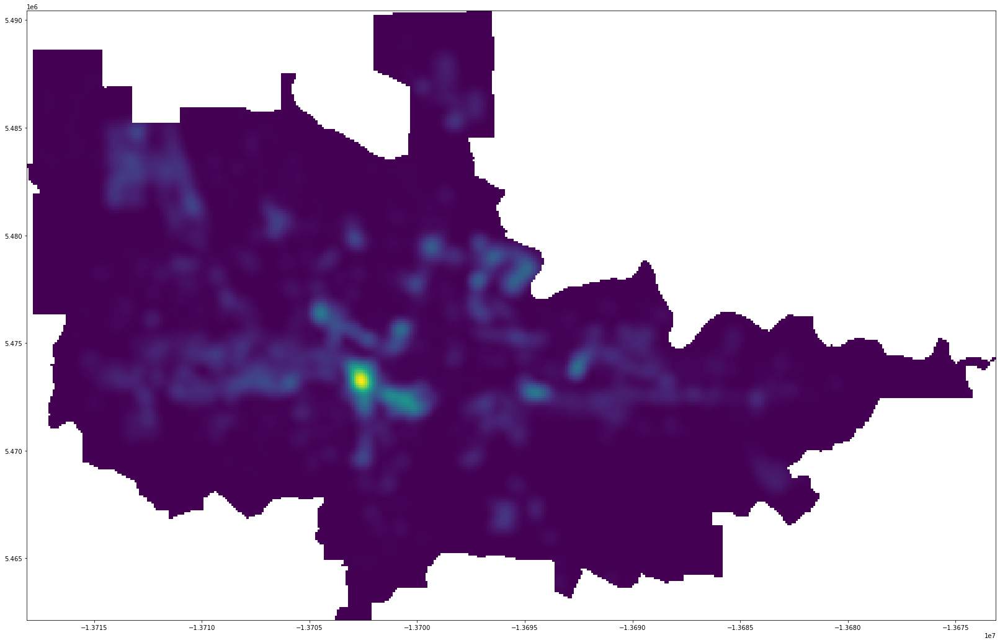

<AxesSubplot:>

In [10]:
fig, ax = plt.subplots(1, figsize=(28, 24))
show(src)

C:\Users\clid1852\.conda\envs\geoenv\lib\site-packages\matplotlib\image.py:506: RuntimeWarning: overflow encountered in multiply
  A_resampled *= ((a_max - a_min) / frac)


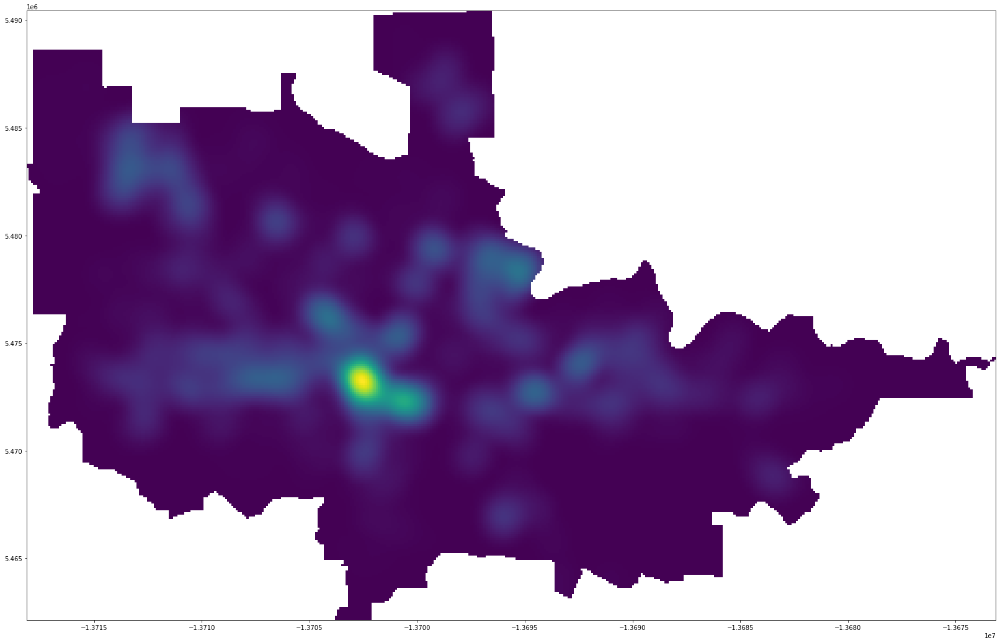

<AxesSubplot:>

In [7]:
fig, ax = plt.subplots(1, figsize=(28, 24))
show(src)

In [6]:
colormap = 'Reds'

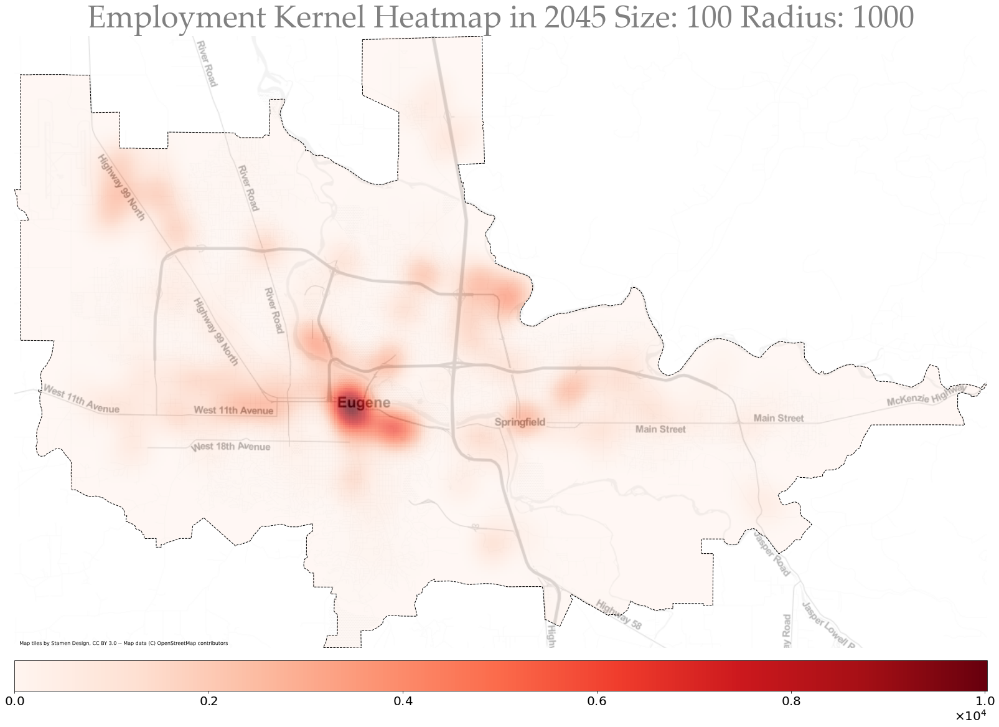

In [12]:
fig, ax = plt.subplots(1, figsize=(28, 24))
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad="2%")
data = src.read(1)
ndata = np.where(data == data.min(), np.nan, data)
data_ex = data[data != data.min()]
image = show(ndata,  
             transform=src.transform,
             ax=ax,
             cmap=colormap)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, alpha=0.3)
ax.set_title(dataName + " " + method + " Heatmap in " + str(year) + " Size: " + str(cellSize) + " Radius: " + str(searchRadius), 
             fontsize=50, fontname="Palatino Linotype", color="grey", loc = 'center')
image_hidden = ax.imshow(ndata,cmap=colormap)
fmt = mpl.ticker.ScalarFormatter(useMathText=True)
fmt.set_powerlimits((0, 0))
cbar = plt.colorbar(image_hidden, format=fmt, ax=ax, cax=cax, orientation="horizontal")
mpl.rcParams.update({'font.size': 20})
ax.axis("off");

In [1]:
import plot_heatmap as phm

Saved image Kerneljobs45_100_1000.png...


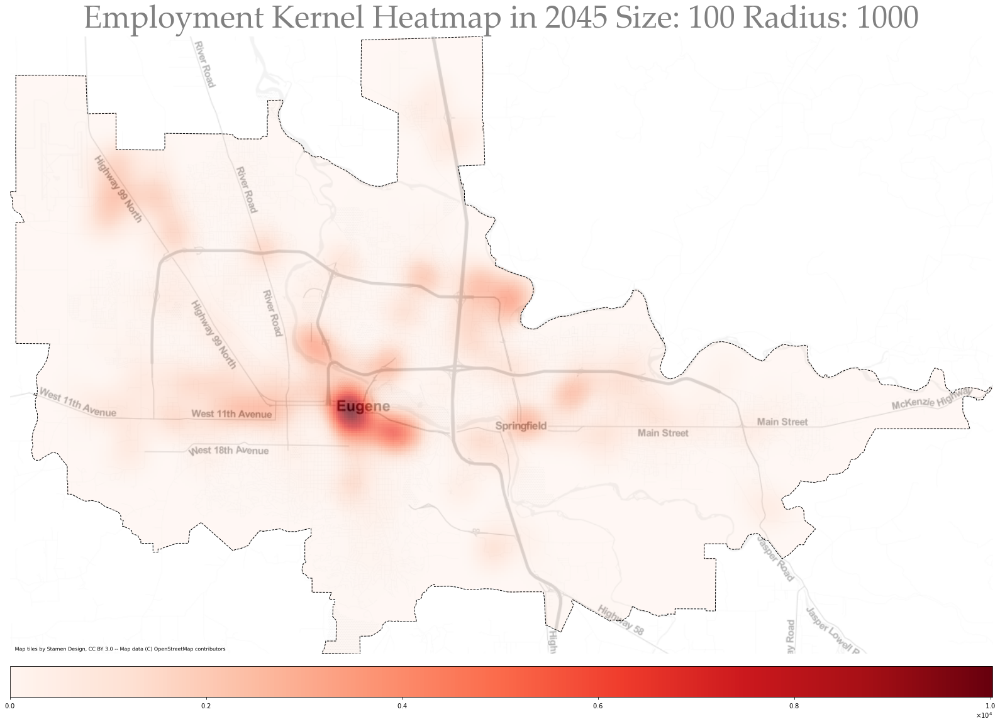

In [2]:
phm.plotHeatmap(export = True)

Saved image Kerneljobs45_25_1000_RdBu_r.png...


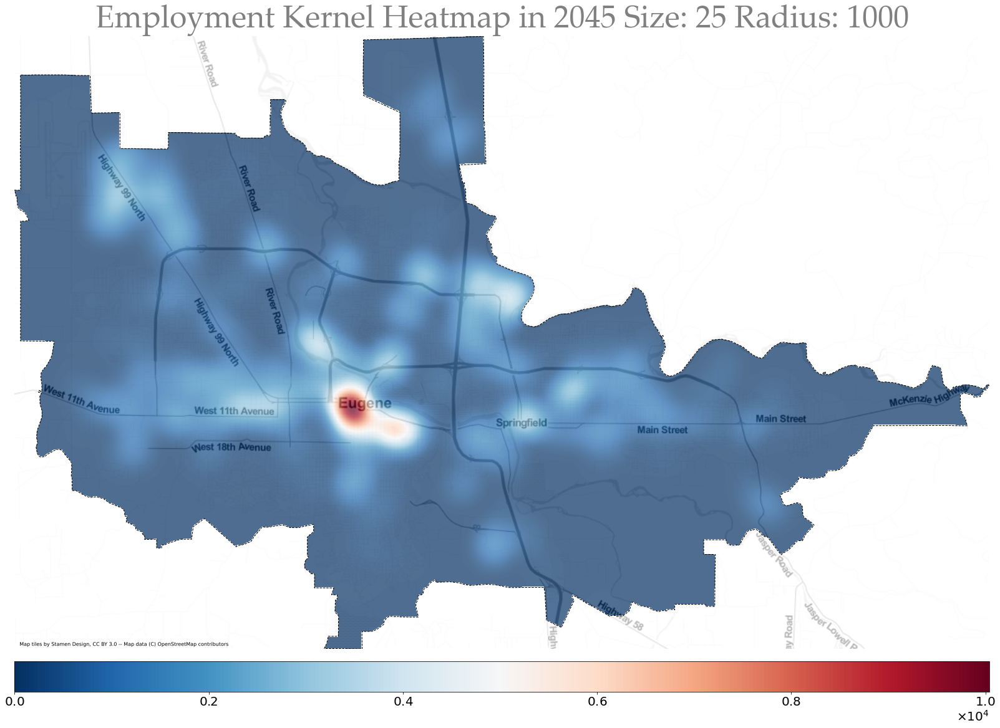

In [3]:
phm.plotHeatmap(cellSize = 25, colormap = 'RdBu_r', export = True, changeFileNm = True)

In [3]:
datasets = ["jobs", "households"]
dataNames = ["Employment", "Households"]

Saved image Kerneljobs45_9_500.png...
Saved image Kerneljobs45_9_1000.png...
Saved image Kerneljobs45_9_2000.png...
Saved image Kernelhouseholds45_9_500.png...
Saved image Kernelhouseholds45_9_1000.png...
Saved image Kernelhouseholds45_9_2000.png...
Saved image Kerneljobs45_16_500.png...
Saved image Kerneljobs45_16_1000.png...
Saved image Kerneljobs45_16_2000.png...
Saved image Kernelhouseholds45_16_500.png...
Saved image Kernelhouseholds45_16_1000.png...
Saved image Kernelhouseholds45_16_2000.png...
Saved image Kerneljobs45_25_500.png...
Saved image Kerneljobs45_25_1000.png...
Saved image Kerneljobs45_25_2000.png...
Saved image Kernelhouseholds45_25_500.png...
Saved image Kernelhouseholds45_25_1000.png...
Saved image Kernelhouseholds45_25_2000.png...


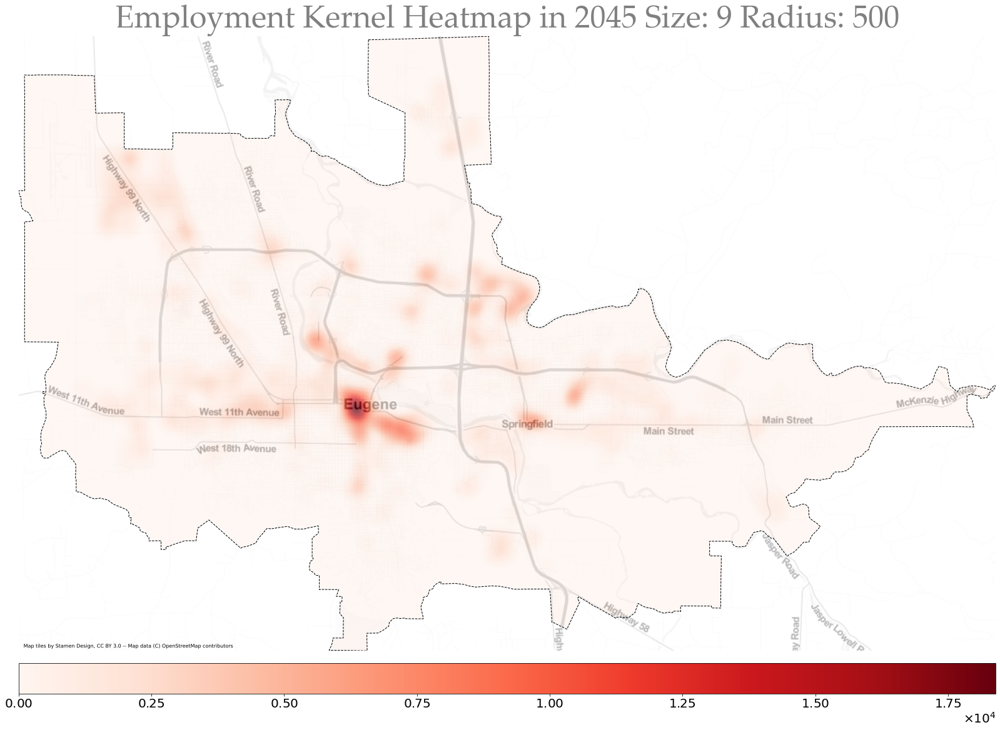

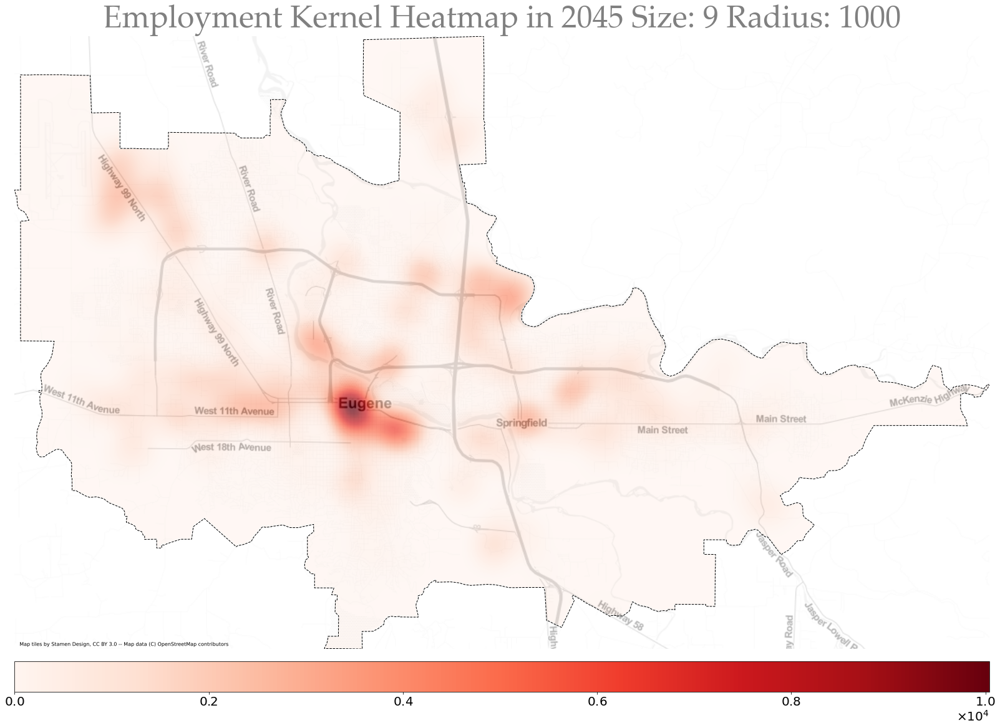

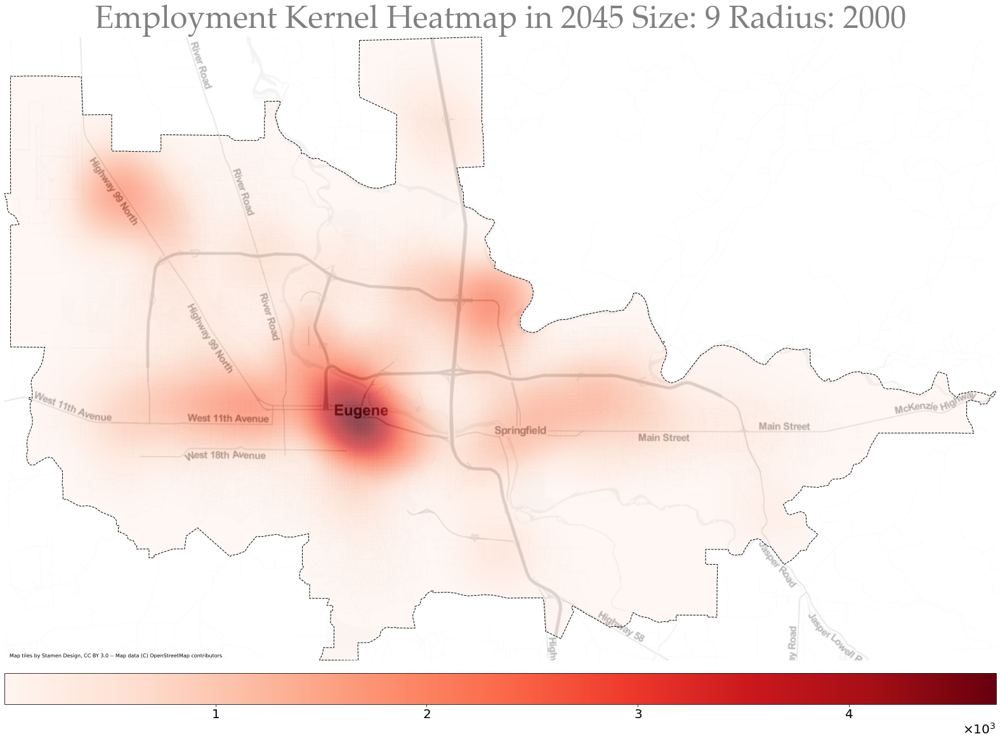

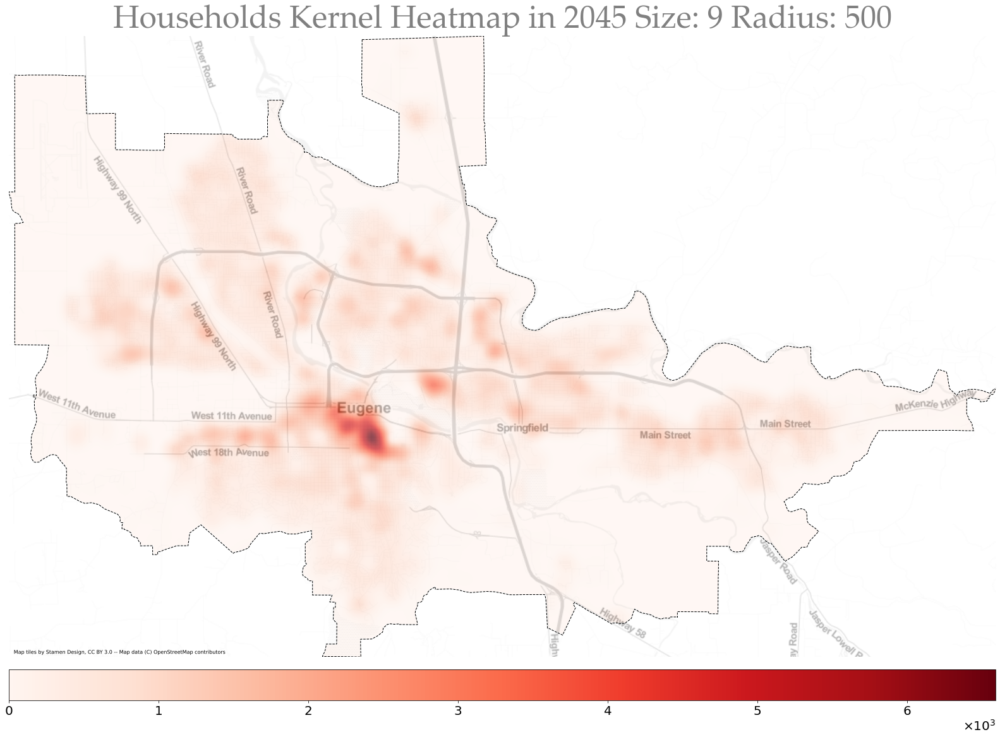

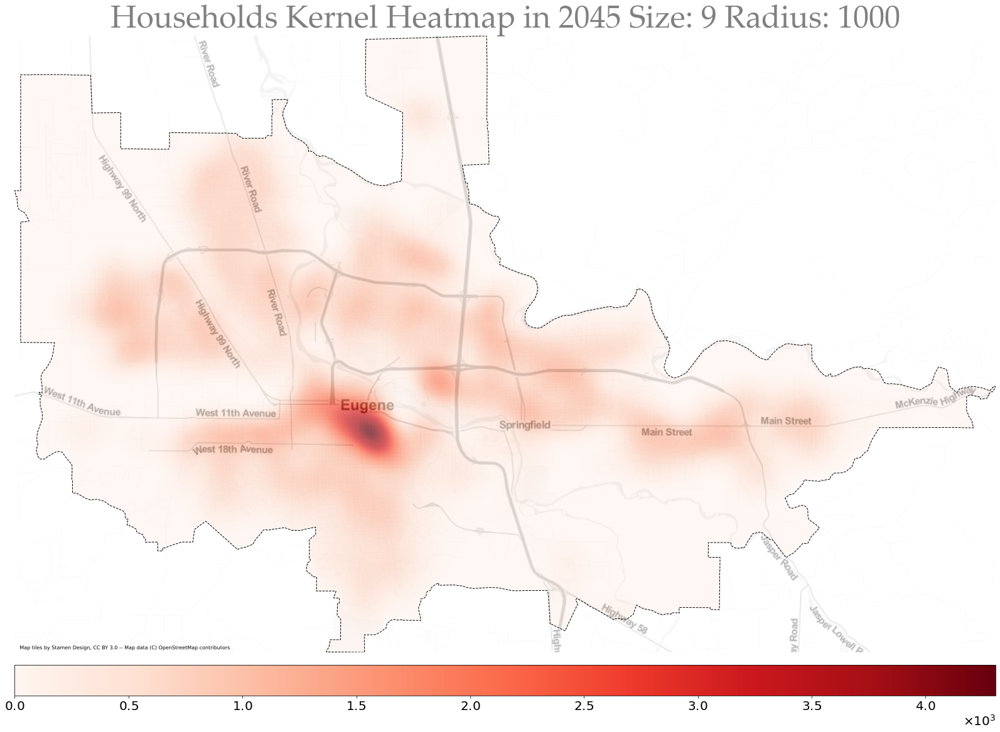

...

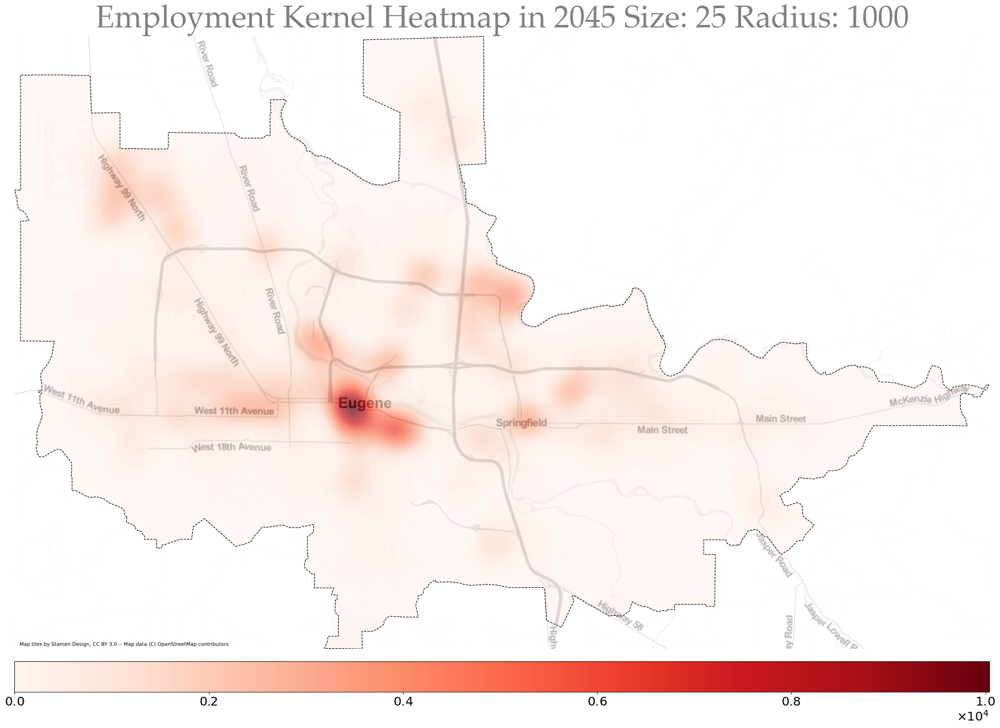

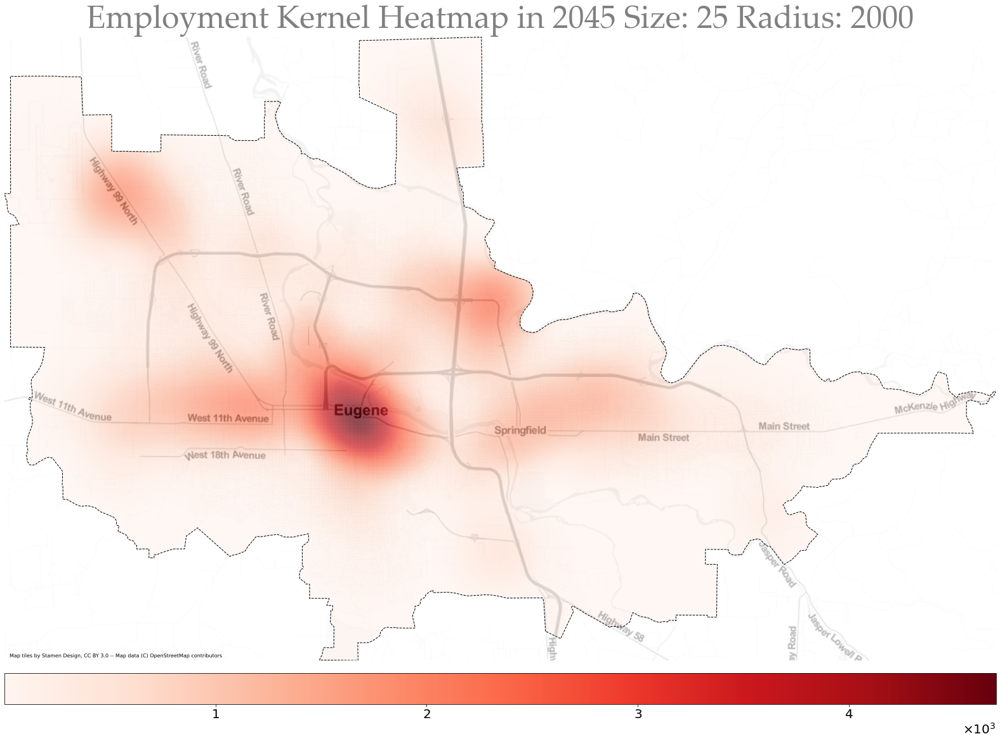

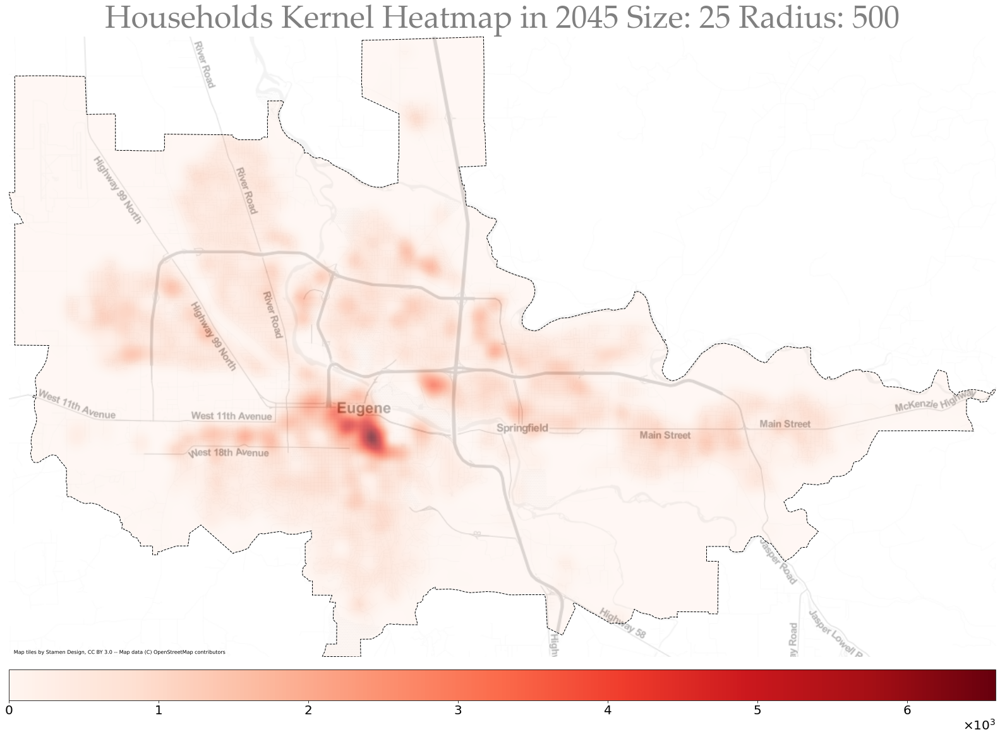

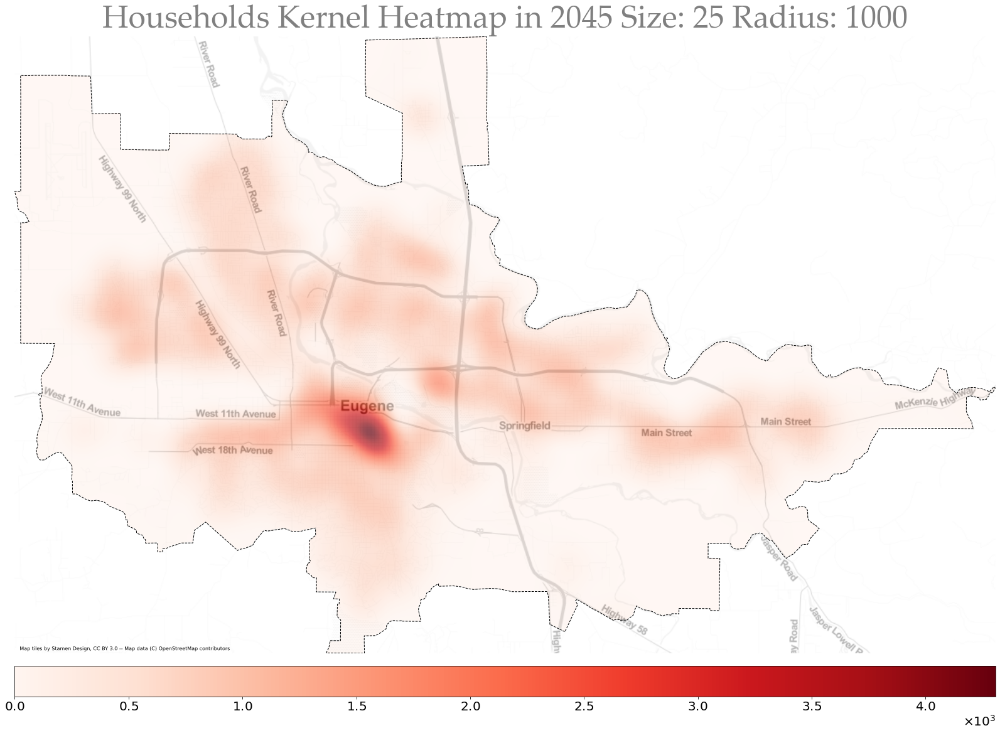

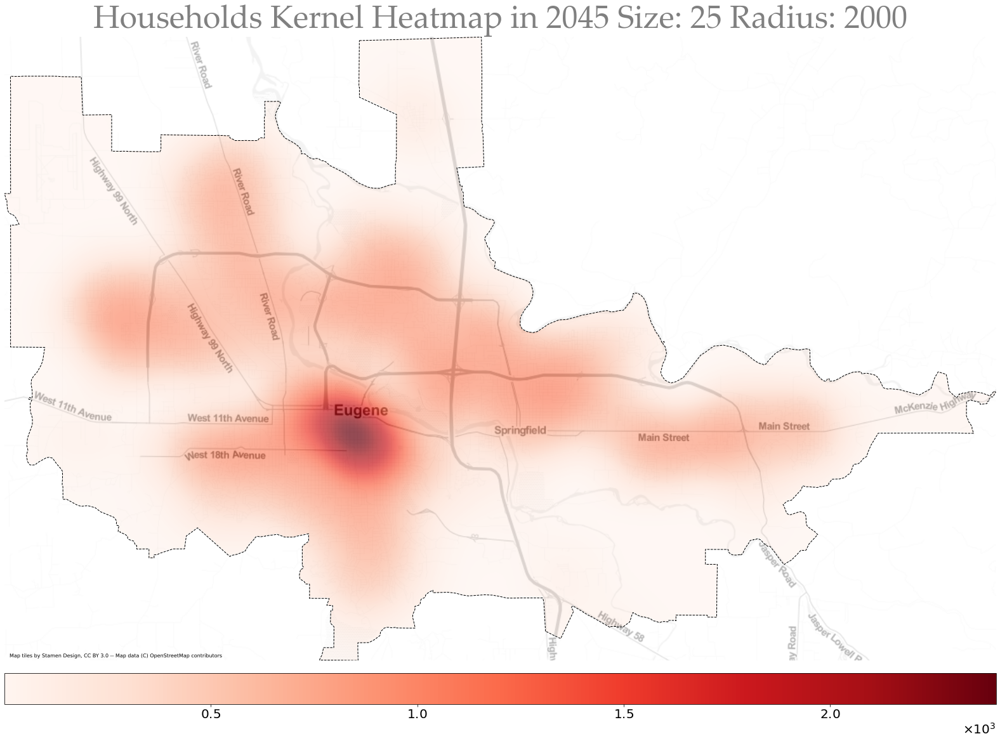

In [4]:
for cellSize in [9, 16, 25]: # range(50, 251, 50)
    for method in ['Kernel']: #['Kernel', 'Point']
        for dataset in datasets:
            for searchRadius in [500, 1000, 2000]:
                phm.plotHeatmap(data = dataset , dataName = dataNames[datasets.index(dataset)], 
                                method = method, cellSize = cellSize, searchRadius = searchRadius, export = True)